## Preparation

Bring in libraries

In [1]:
from tqdm import tqdm_notebook
from tqdm.notebook import tqdm_notebook
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
import seaborn as sns
from folium.plugins import MarkerCluster
from folium import PolyLine
from folium.features import GeoJsonTooltip
from shapely.geometry import LineString


Data

In [2]:
cities_data = pd.read_csv('../../data/cities_and_airports.csv')

display(cities_data.shape)
display(cities_data.head())

(42, 8)

,country,capital_city,capital_latitude,capital_longitude,airport_iata,airport_name,airport_latitude,airport_longitude
0,Armenia,Yerevan,40.1812,44.5136,EVN,Zvartnots International Airport,40.147301,44.395901
1,Azerbaijan,Baku,40.3953,49.8622,GYD,Heydar Aliyev International Airport,40.467499,50.046700
2,Bahrain,Manama,26.2361,50.5831,BAH,Bahrain International Airport,26.270800,50.633598
3,Bangladesh,Dhaka,23.7231,90.4086,DAC,Hazrat Shahjalal International Airport,23.843347,90.397783
4,Brunei,Bandar Seri Begawan,4.8833,114.9333,BWN,Brunei International Airport,4.944200,114.928001


In [3]:
best_flights_data = pd.read_csv('../../data/best_flights_data.csv')

display(best_flights_data.shape)
display(best_flights_data.head())

(1722, 14)

,id,price_amount,marketing_carrier_name,origin_place_name,origin_place_iata,destination_place_name,destination_place_iata,departure_datetime,arrival_datetime,departure_query,arrival_query,segment_count,total_flight_duration,flight_score
0,9445-2305221250--32348-1-9561-2305230325,368.17,Emirates > Emirates,Amman Queen Alia > Dubai,AMM > DXB,Dubai > Ashgabat,DXB > ASB,2023-05-22 12:50:00,2023-05-23 03:25:00,AMM,ASB,2,330,578.17
1,9445-2305220835--32761-0-9618-2305221240,82.34,Wizz Air Abu Dhabi,Amman Queen Alia,AMM,Abu Dhabi International,AUH,2023-05-22 08:35:00,2023-05-22 12:40:00,AMM,AUH,1,185,194.01
2,"9445-2305221730--30759,-31669-1-9715-2305230640",207.99,Air Arabia Abu Dhabi > Wizz Air,Amman Queen Alia > Abu Dhabi International,AMM > AUH,Abu Dhabi International > Bahrain,AUH > BAH,2023-05-22 17:30:00,2023-05-23 06:40:00,AMM,BAH,2,250,391.32
3,9445-2305221000--32062-0-9834-2305221100,188.90,MEA,Amman Queen Alia,AMM,Beirut,BEY,2023-05-22 10:00:00,2023-05-22 11:00:00,AMM,BEY,1,60,258.90
4,9445-2305220515--31923-0-9882-2305220700,214.90,Royal Jordanian,Amman Queen Alia,AMM,Baghdad International,BGW,2023-05-22 05:15:00,2023-05-22 07:00:00,AMM,BGW,1,105,299.90


In [4]:
# Asia shapefile
world_map = gpd.read_file(
    '../../data/WorldAdministrativeBoundaries/world-administrative-boundaries.shp')

## EDA

In [5]:
# create geodataframe
gdf_airports = gpd.GeoDataFrame(cities_data,
                                geometry=gpd.points_from_xy(cities_data.airport_longitude,
                                                            cities_data.airport_latitude))
# filter map to include only asia
asia_map = world_map.query("continent == 'Asia'")

# init folium map
m = folium.Map(location=[asia_map.bounds.mean()[1], asia_map.bounds.mean()[0]],
               zoom_start=3,
               # Esri.NatGeoWorldMap tile
               tiles='https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}',
               attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC',
               )

# add asia shapefile
folium.GeoJson(asia_map).add_to(m)

# add markers
for lat, lon, city, country, airport in zip(gdf_airports.geometry.y, gdf_airports.geometry.x, gdf_airports.capital_city, gdf_airports.country, gdf_airports.airport_name):
    folium.Marker(location=[lat, lon],
                  tooltip=f'{airport}<br>{city}').add_to(m)

# show
m.save('../../assets/resources/Outputs/Plots/map_of_airport_locations.html')
m

In [6]:
# create geodataframe
gdf_airports = gpd.GeoDataFrame(cities_data,
                                geometry=gpd.points_from_xy(cities_data.airport_longitude,
                                                            cities_data.airport_latitude))
# filter map to include only asia
asia_map = world_map.query("continent == 'Asia'")

# init folium map
m = folium.Map(location=[asia_map.bounds.mean()[1], asia_map.bounds.mean()[0]],
               zoom_start=3,
               # Esri.NatGeoWorldMap tile
               tiles='https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}',
               attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC',
               )

# add asia shapefile
folium.GeoJson(asia_map).add_to(m)

# add markers
for lat, lon, city, country, airport in zip(gdf_airports.geometry.y, gdf_airports.geometry.x, gdf_airports.capital_city, gdf_airports.country, gdf_airports.airport_name):
    folium.Marker(location=[lat, lon],
                  tooltip=f'{airport}<br>{city}').add_to(m)


# set the color based on price
def get_color(price):
    if price <= 300:
        return 'green'
    elif price <= 700:
        return 'blue'
    elif price <= 1000:
        return 'orange'
    else:
        return 'red'

# offset to avoid overlaping
def create_offset_line(coords1, coords2, offset_value):
    line = LineString([coords1, coords2])
    offset_line = line.parallel_offset(offset_value, 'left')
    return [(x, y) for x, y in offset_line.coords]


# iterate through the best flight data
for _, row in best_flights_data.iterrows():
    departure_airport = row['departure_query']
    arrival_airport = row['arrival_query']
    price = row['price_amount']
    segment_count = row['segment_count']
    total_flight_duration = row['total_flight_duration']

    # get departure and arrival coordinates
    departure_data = cities_data.loc[cities_data['airport_iata']
                                        == departure_airport]
    departure_coords = departure_data[[
        'airport_latitude', 'airport_longitude']].values[0]
    departure_city = departure_data['capital_city'].values[0]

    arrival_data = cities_data.loc[cities_data['airport_iata']
                                      == arrival_airport]
    arrival_coords = arrival_data[[
        'airport_latitude', 'airport_longitude']].values[0]
    arrival_city = arrival_data['capital_city'].values[0]

    # offset
    offset_coords = create_offset_line(
        (departure_coords[1], departure_coords[0]), (arrival_coords[1], arrival_coords[0]), 0.1)

    # create geojson object
    line_data = {
        "type": "Feature",
        "geometry": {
            "type": "LineString",
            "coordinates": offset_coords
        },
        "properties": {
            "color": get_color(price),
            "from_to": f"{departure_city} - {arrival_city}",
            "price": price,
            "segment_count": segment_count,
            "total_flight_duration": total_flight_duration
        }
    }

    # add the tooltip
    tooltip = GeoJsonTooltip(fields=["from_to", "price", "segment_count", "total_flight_duration"],
                             aliases=["Route", "Price", "Segment Count",
                                      "Total Flight Duration"],
                             localize=True)

    # add to map
    folium.GeoJson(line_data,
                   style_function=lambda x: {
                       'color': x['properties']['color']},
                   tooltip=tooltip).add_to(m)

# show
m.save('../../assets/resources/Outputs/Plots/map_of_airport_links.html')
m

## Experiments

In [7]:
# function to create the transition matrix
def create_transition_matrix_numpy(best_flights_data, cities_data):
    n = len(cities_data)
    city_to_index = {city: idx for idx, city in enumerate(cities_data)}

    transition_matrix = np.zeros((n, n))

    for idx, row in best_flights_data.iterrows():
        departure = row["departure_query"]
        arrival = row["arrival_query"]
        price = row["flight_score"]

        i = city_to_index[departure]
        j = city_to_index[arrival]

        transition_matrix[i, j] = price

    np.fill_diagonal(transition_matrix, 0)
    return transition_matrix

# get unique airports
airport_list = best_flights_data["departure_query"].unique().tolist()

# make the transition matrix
transition_matrix = create_transition_matrix_numpy(
    best_flights_data, airport_list)

# check
transition_matrix

array([[   0.  ,  578.17,  194.01, ...,  882.05, 1054.27,  857.99],
       [ 845.67,    0.  ,  770.67, ..., 1352.2 , 1311.32, 1301.57],
       [ 185.28,  571.99,    0.  , ...,  662.4 ,  874.66,  589.32],
       ...,
       [1616.72, 1111.93,  741.83, ...,    0.  ,  770.37,  670.09],
       [1170.53, 1321.99,  997.67, ...,  645.93,    0.  ,  685.1 ],
       [1027.99, 1129.9 ,  661.66, ...,  480.85,  873.74,    0.  ]])

Q Agent (based on https://github.com/TheoLvs/reinforcement-learning)

In [8]:
class TravelQAgent(object):
    def __init__(self, states_size, actions_size, epsilon=1.0, epsilon_min=0.01, epsilon_decay=0.999, gamma=0.95, lr=0.8):
        self.states_size = states_size
        self.actions_size = actions_size
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.gamma = gamma
        self.lr = lr
        self.Q = self.build_model(states_size, actions_size)
        self.reset_memory()
        self.episode_stops = [] 

    def build_model(self, states_size, actions_size):
        Q = np.zeros([states_size, actions_size])
        return Q

    def train(self, s, a, r, s_next, done): 
        self.Q[s, a] = self.Q[s, a] + self.lr * \
            (r + self.gamma*np.max(self.Q[s_next, a]) - self.Q[s, a])

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

        self.remember_state(s)

        if done:  # Check if the episode is complete
            self.episode_stops.append(self.states_memory)
            self.reset_memory()

    def act(self, s):
        q = np.copy(self.Q[s, :])
        q[self.states_memory] = -np.inf

        if np.random.rand() > self.epsilon:
            a = np.argmax(q)
        else:
            a = np.random.choice(
                [x for x in range(self.actions_size) if x not in self.states_memory])

        return a

    def remember_state(self, s):
        self.states_memory.append(s)

    def reset_memory(self):
        self.states_memory = []


Environment (based on https://github.com/TheoLvs/reinforcement-learning)

In [9]:

class FlightTravelEnvironment(object):
    def __init__(self, cities_data, airport_list, transition_matrix, best_flights_data, **kwargs):
        print(
            f"Initialized Delivery Environment with {len(airport_list)} airports")

        # Initialization
        self.cities_data = cities_data
        self.airport_data = airport_list
        self.transition_matrix = transition_matrix
        self.best_flights_data = best_flights_data

        self.n_stops = len(airport_list)
        self.action_space = self.n_stops
        self.observation_space = self.n_stops
        self.stops = []
        
        #store
        self.total_price_amount = 0
        self.total_flight_duration = 0
        self.total_segment_count = 0

        # generate stops
        self._generate_q_values()

        # init
        self.reset()

    def _generate_q_values(self):
        # generate q values
        self.q_stops = self.transition_matrix


    def reset_accumulated_values(self):
        self.total_price_amount = 0
        self.total_flight_duration = 0
        self.total_segment_count = 0
    
    def reset(self):
        
        self.reset_accumulated_values()

        # init stops
        self.stops = []

        # generate random first stop
        first_stop = np.random.randint(self.n_stops)
        self.stops.append(first_stop)

        return first_stop

    def step(self, destination):

        # get state
        state = self._get_state()
        new_state = destination
        
        # get codes for storing the price etc
        state_code = self.airport_data[state]
        new_state_code = self.airport_data[new_state]

        # get reward
        reward = self._get_reward(state, new_state)

        # append to stops
        self.stops.append(destination)
        
        done = len(self.stops) == self.n_stops

        # perform updates
        row = self.best_flights_data.loc[(self.best_flights_data['departure_query'] == state_code) & (self.best_flights_data['arrival_query'] == new_state_code)].iloc[0]
        self.total_price_amount += row["price_amount"]
        self.total_flight_duration += row["total_flight_duration"]
        self.total_segment_count += row["segment_count"]

        return new_state, reward, done

    def _get_state(self):
        return self.stops[-1]


    def _get_reward(self, state, new_state):
        base_reward = self.q_stops[state, new_state]

        return base_reward



In [10]:
def run_episode(env, agent, verbose=1):

    s = env.reset()
    agent.reset_memory()

    max_step = env.n_stops

    episode_reward = 0

    i = 0
    while i < max_step:

        # store state
        agent.remember_state(s)

        # choose action
        a = agent.act(s)

        # make action, get reward
        s_next, r, done = env.step(a)

        # make reward negative (cost)
        r = -1 * r

        if verbose:
            print(s_next, r, done)

        # update q table
        agent.train(s, a, r, s_next, done)

        # updates
        episode_reward += r
        s = s_next

        # check if episode ended
        i += 1
        if done:
            break

    return env, agent, episode_reward, env.total_price_amount, env.total_flight_duration, env.total_segment_count


In [11]:
def run_n_episodes(env, agent, n_episodes=100):

    # init lists
    rewards = []
    price_amounts = []
    flight_durations = []
    segment_counts = []

    # run episodes
    for i in tqdm_notebook(range(n_episodes)):

        # run the episode
        env, agent, episode_reward, total_price_amount, total_flight_duration, total_segment_count = run_episode(env, agent, verbose=0)
        
        rewards.append(episode_reward)

        price_amounts.append(total_price_amount)
        flight_durations.append(total_flight_duration)
        segment_counts.append(total_segment_count)

    # helper to snake case the file names
    def to_snake_case(text):
        words = text.split()
        snake_case_words = [words[0].lower()]
        snake_case_words += [word.lower() for word in words[1:]]
        return '_'.join(snake_case_words)


    # make plots
    for metric in [rewards, price_amounts, flight_durations, segment_counts]:
        
        if metric == rewards:
            title_text = 'Flight Score'
        
        elif metric == price_amounts:
            title_text = 'Fares in USD'

        
        elif metric == flight_durations:
            title_text = 'Flight Time'

        
        elif metric == segment_counts:
            title_text = 'Flight Stops'

        
        plt.figure(figsize=(10, 6))
        sns.lineplot(data=metric, color='royalblue')
        plt.title(f"{title_text} Per Episode During Training")
        plt.xlabel("Episode", fontsize=14, fontweight='bold')
        plt.ylabel(title_text, fontsize=14, fontweight='bold')
        
        def format_with_commas(x, pos):
            return '{:,.0f}'.format(x)
        
        # set the y-axis tick formatter to the function
        formatter = ticker.FuncFormatter(format_with_commas)
        plt.gca().yaxis.set_major_formatter(formatter)

        # set the background color and add a grid
        plt.gca().set_facecolor('#F2F2F2')
        plt.grid(axis='y', color='white', linestyle='--', linewidth=1)
        
        plt.savefig(f'../../assets/resources/Outputs/Plots/{to_snake_case(title_text)}.png', dpi=300, bbox_inches='tight')
                
        plt.show()
    


    return env, agent

Initialized Delivery Environment with 42 airports


  0%|          | 0/200 [00:00<?, ?it/s]

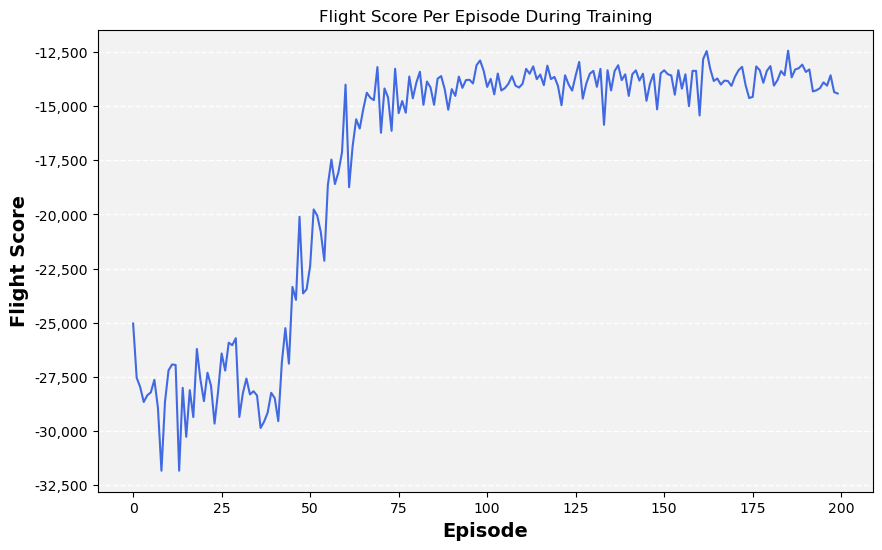

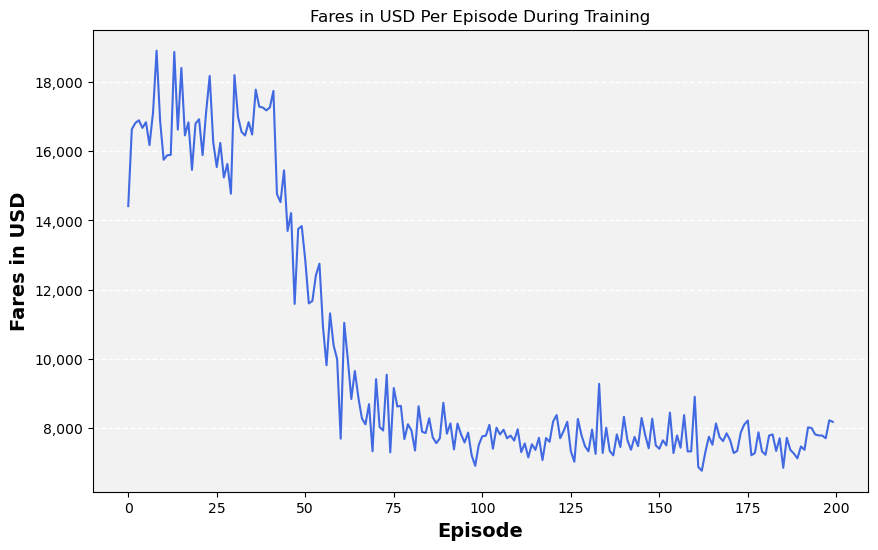

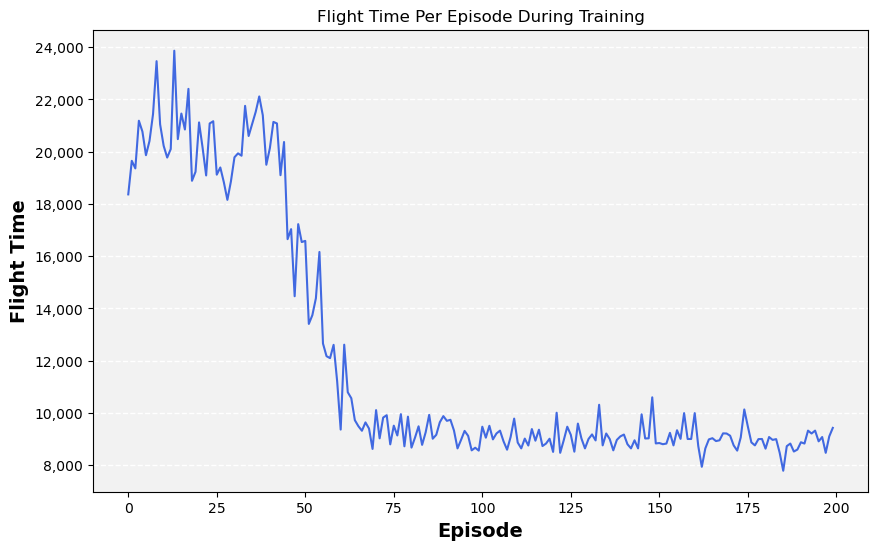

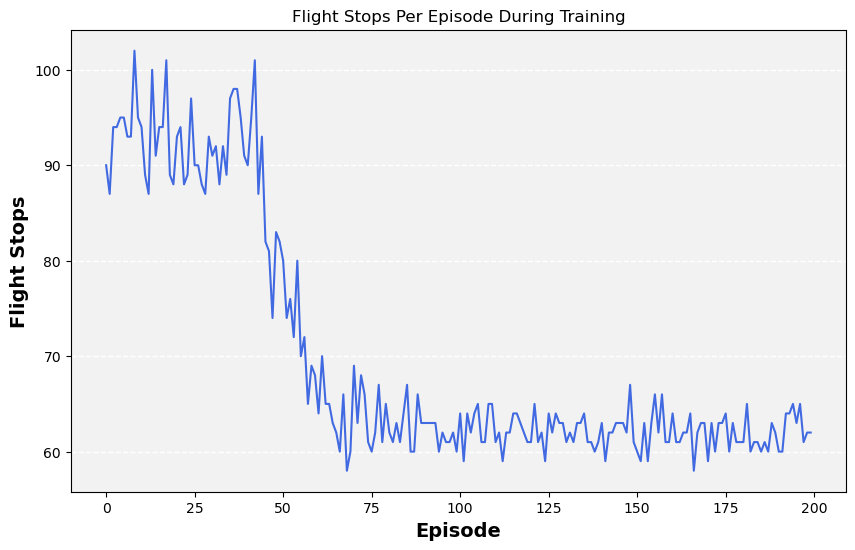

(<__main__.FlightTravelEnvironment at 0x176f86710>,
 <__main__.TravelQAgent at 0x176f843d0>)

In [12]:
# run the model
env = FlightTravelEnvironment(cities_data, airport_list, transition_matrix, best_flights_data)
agent = TravelQAgent(env.observation_space, env.action_space)
run_n_episodes(env, agent, n_episodes=200)

See routes

In [13]:
def render(stops, map_title):
    gdf_airports = gpd.GeoDataFrame(cities_data,
                                    geometry=gpd.points_from_xy(cities_data.airport_longitude,
                                                                cities_data.airport_latitude))
    asia_map = world_map.query("continent == 'Asia'")

    m = folium.Map(location=[asia_map.bounds.mean()[1], asia_map.bounds.mean()[0]],
                   zoom_start=3,
                   tiles='https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}',
                   attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC',
                   )

    folium.GeoJson(asia_map).add_to(m)

    for lat, lon, city, country, airport in zip(gdf_airports.geometry.y, gdf_airports.geometry.x, gdf_airports.capital_city, gdf_airports.country, gdf_airports.airport_name):
        folium.Marker(location=[lat, lon],
                      tooltip=f'{airport}<br>{city}').add_to(m)

    if len(stops) > 1:
        for i in range(len(stops) - 1):
            x = cities_data["airport_longitude"].to_numpy()[stops[i:i+2]]
            y = cities_data["airport_latitude"].to_numpy()[stops[i:i+2]]
            locations = list(zip(y, x))
            from_city = cities_data.loc[stops[i], "capital_city"]
            from_country = cities_data.loc[stops[i], "country"]
            to_city = cities_data.loc[stops[i+1], "capital_city"]
            to_country = cities_data.loc[stops[i+1], "country"]
            polyline = folium.PolyLine(locations, color="blue", weight=2.5, opacity=1)
            polyline.add_child(folium.Tooltip(f'From: {from_city}<br>To: {to_city}'))
            polyline.add_to(m)
    
    
    m.save(f'../../assets/resources/Outputs/Plots/{map_title}_links.html')

    return m


In [14]:
# access the first and last episode stops
first_episode_stops = agent.episode_stops[0]
last_episode_stops = agent.episode_stops[-1]

In [15]:
render(first_episode_stops, "first_episode")


In [16]:
render(last_episode_stops, "last_episode")
